In [56]:
#Preamble.
import os

print("Current: {0}".format(os.getcwd()))
#os.chdir('/tmp')


#Local Work Directory.
work_dir = 'C:/Users/cianr/OneDrive/Desktop/IPA/'
print(work_dir)


#Image Directory.
image_dir = os.path.join(work_dir, 'images/')
print(image_dir)


!pip show scikit_image

Current: C:\Users\cianr
C:/Users/cianr/OneDrive/Desktop/IPA/
C:/Users/cianr/OneDrive/Desktop/IPA/images/
Name: scikit-image
Version: 0.18.1
Summary: Image processing in Python
Home-page: https://scikit-image.org
Author: None
Author-email: None
License: Modified BSD
Location: c:\users\cianr\anaconda3\lib\site-packages
Requires: numpy, scipy, matplotlib, networkx, pillow, imageio, tifffile, PyWavelets
Required-by: 


In [ ]:
#Importing packages.
from skimage import data, io, filters, color
from skimage.filters import gaussian
from skimage.util import random_noise
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
from skimage.transform import resize
from tabulate import tabulate

Current: C:\Users\cianr
C:/Users/cianr/OneDrive/Desktop/IPA/
C:/Users/cianr/OneDrive/Desktop/IPA/images/
Name: scikit-image
Version: 0.18.1
Summary: Image processing in Python
Home-page: https://scikit-image.org
Author: None
Author-email: None
License: Modified BSD
Location: c:\users\cianr\anaconda3\lib\site-packages
Requires: numpy, scipy, matplotlib, networkx, pillow, imageio, tifffile, PyWavelets
Required-by: 
|       Min |   Max |   Mean  |
|-----------+-------+---------|
| 0.0115522 |     1 | 0.36354 |
|Raw dimensions: (937, 470, 3) |
|final Dimensions: (512, 512) |


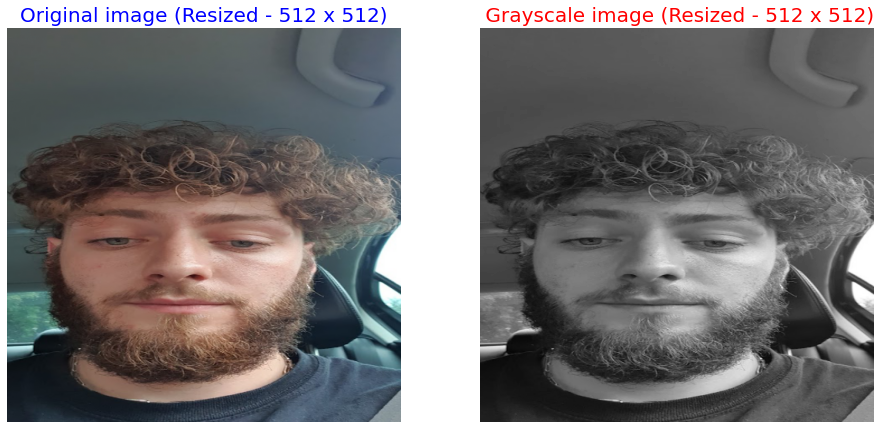

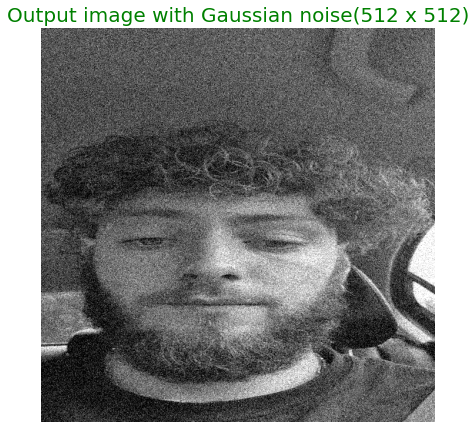

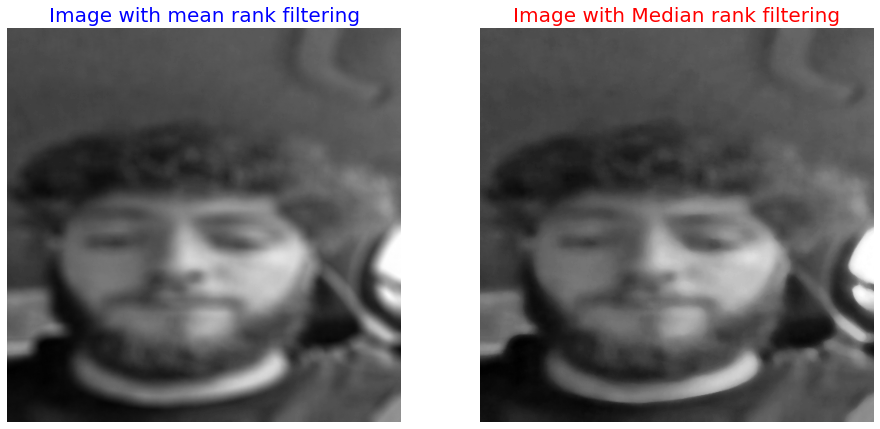

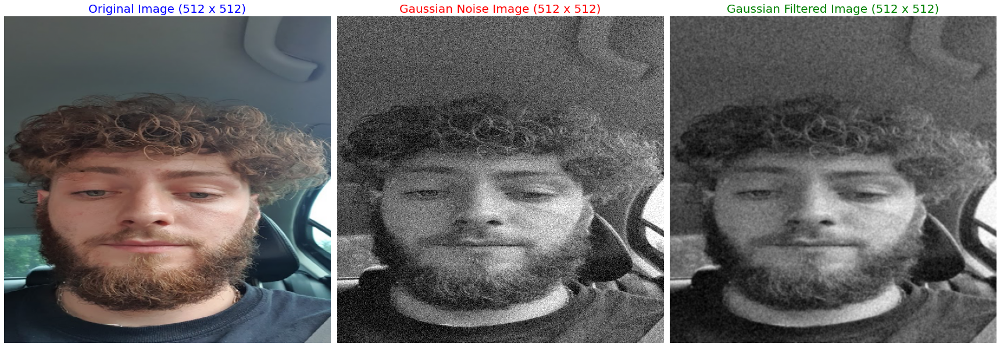

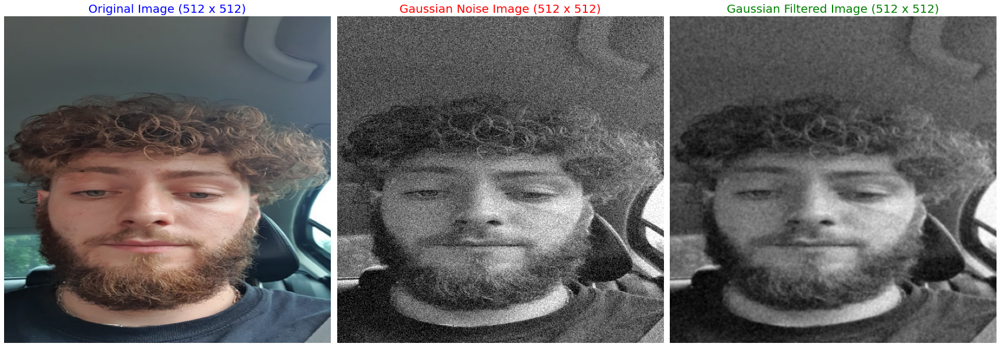

...

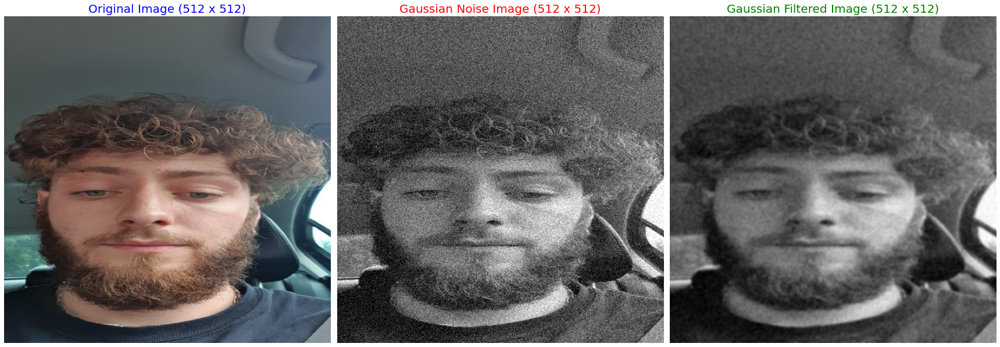

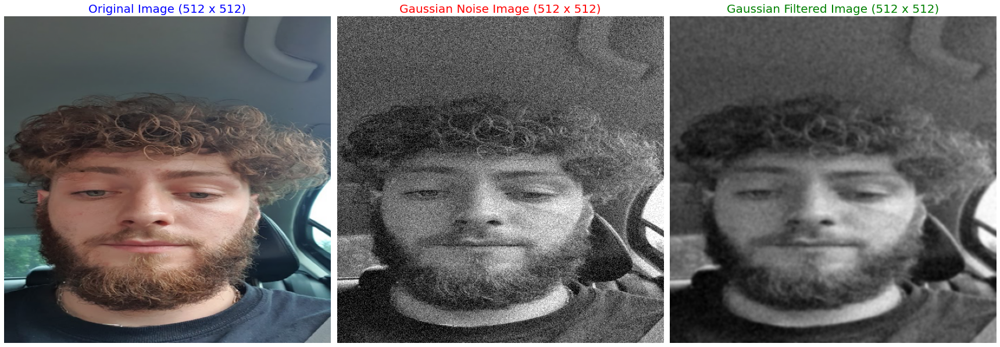

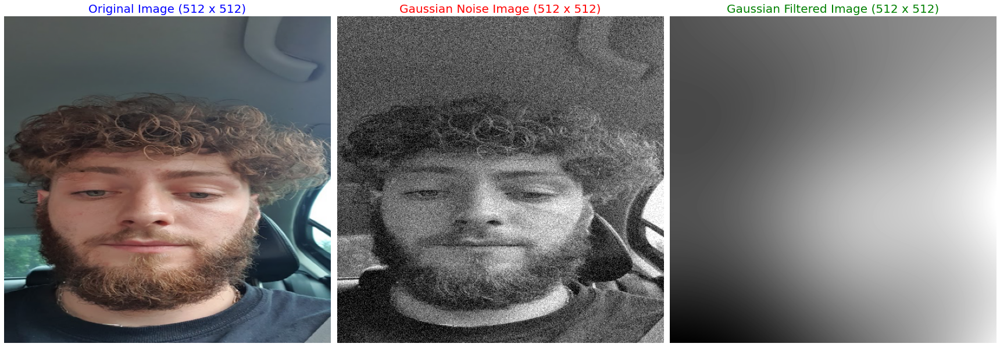

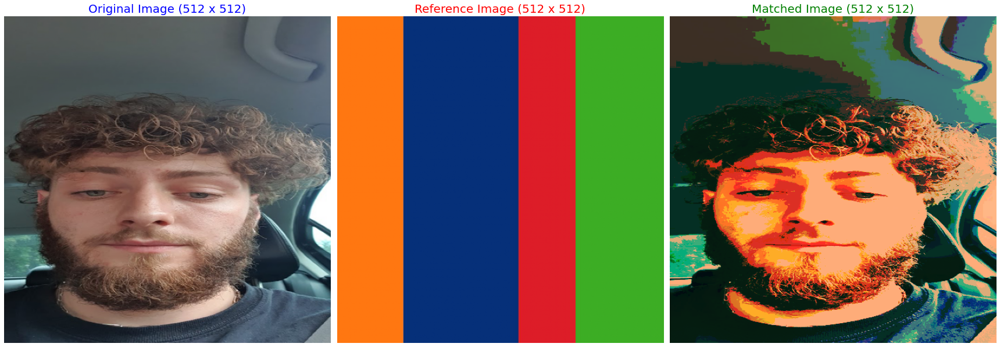

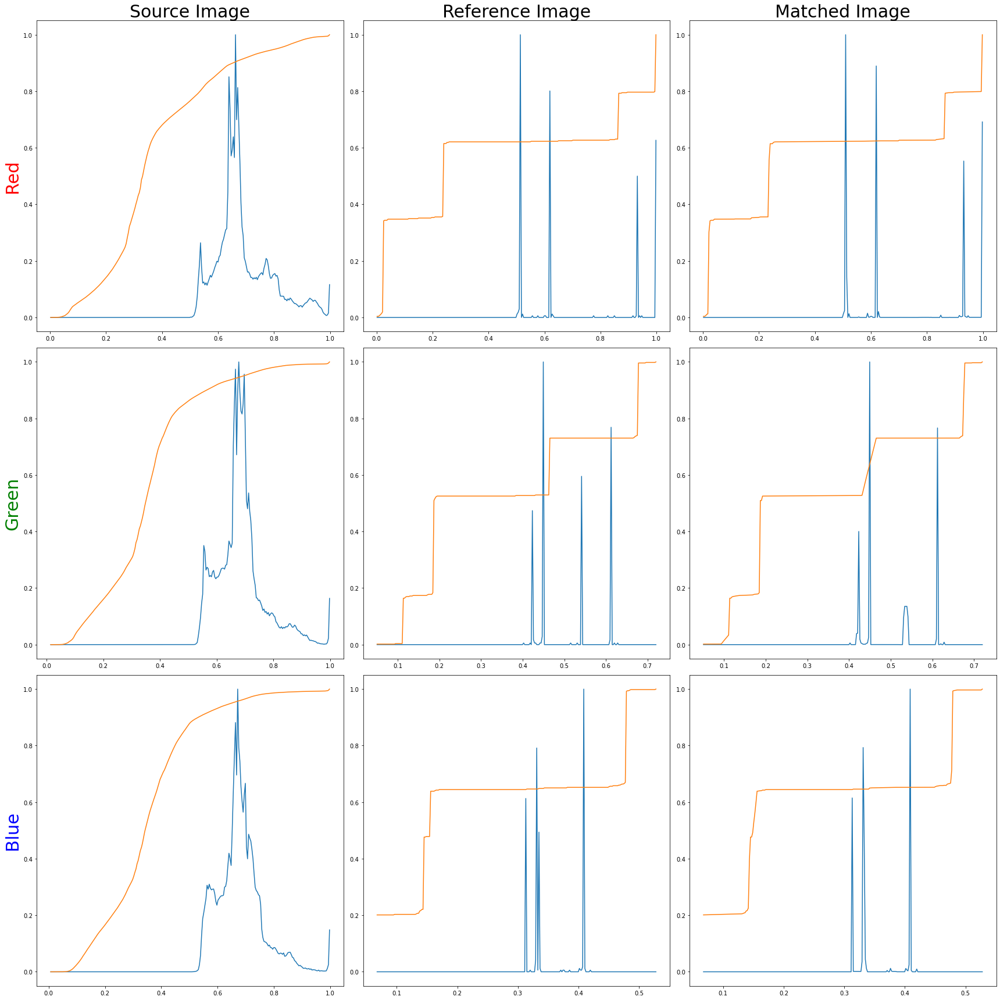

In [224]:
%matplotlib inline

#---------------------------------------------------------------------------------------------------------#
#                                                   preamble.                                             #
#---------------------------------------------------------------------------------------------------------#
import os

print("Current: {0}".format(os.getcwd()))
#os.chdir('/tmp')

#Local Work Directory.
work_dir = 'C:/Users/cianr/OneDrive/Desktop/IPA/'
print(work_dir)

#Image Directory.
image_dir = os.path.join(work_dir, 'images/')
print(image_dir)

!pip show scikit_image

#---------------------------------------------------------------------------------------------------------#
#                                             Importing packages.                                         #
#---------------------------------------------------------------------------------------------------------#
from skimage import data, io, filters, color, exposure
from skimage.filters.rank import mean, median
from skimage.filters import gaussian
from skimage.util import random_noise
from skimage.color import rgb2gray
from skimage.exposure import match_histograms
import matplotlib.pyplot as plt
from skimage.transform import resize
from tabulate import tabulate


#---------------------------------------------------------------------------------------------------------#
#                                              Part 1: Filters.                                           #
#---------------------------------------------------------------------------------------------------------#
#a)

 #Acquire a colour image of your own face (front facing). Develop a programme to resize it to 512x512
 #pixels. Convert this image to greyscale and display your result. Find and display the minimum,
 #maximum and mean greyscale values in this image.


#Loading the raw image file and printing dimensions.
Facial_image = io.imread(os.path.join(image_dir, 'Front_facing_image.jpg'))


#Resizing the image to 512 x 512 pixels.
def Imageresize(Raw_image):
    resizeimage = resize(Raw_image, (512, 512))
    return resizeimage
    

#Converting the image to grayscale and returning image.
def Grayscaleconversion(Resized_image):
    grayscaleimage = rgb2gray(Resized_image)
    return grayscaleimage
    

#Printing the final result and corresponding minimum, maximum and mean values.
def finalimage(grayscaleimage):
    
    print(tabulate([[grayscaleimage.min(), grayscaleimage.max(), grayscaleimage.mean()]], headers=['Min', 'Max', 'Mean '], tablefmt='orgtbl'))
    print("|Raw dimensions:", Facial_image.shape,"|")
    print("|final Dimensions:", grayscaleimage.shape,"|")
    

#Assigning a function to a variable for convenience when the output of the function is needed.    
imgR = Imageresize(Facial_image)
imgG = Grayscaleconversion(imgR)
imgF = finalimage(imgG)     
    

#Rendering the image plots.    
fig, ax = plt.subplots(ncols = 2, figsize = (24, 9))

ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)


ax[0].imshow(imgR, cmap=plt.cm.gray)
ax[0].set_title("Original image (Resized - 512 x 512)", fontsize = 20, color = 'blue')
ax[0].axis("off")

ax[1].imshow(imgG, cmap=plt.cm.gray)
ax[1].set_title(" Grayscale image (Resized - 512 x 512)",fontsize = 20, color = 'red')
ax[1].axis("off")
    
     
plt.savefig(os.path.join(image_dir, 'part1a'))
    
plt.show()
    
    
#b)

 #Taking the output image from part (a) and add Gaussian noise (mean=0.0, variance=0.01). Display
 #your result.


def Gaussian(outputA, variance, M):
    GaussianNoise = random_noise(outputA, mode = 'gaussian', var = variance**2, mean = M)
    return GaussianNoise


#Assigning a function to a variable for convenience when the output of the function is needed.
Gaussimg = Gaussian(imgG, 0.1, 0.0)


#Rendering the image plots.    
fig, ax = plt.subplots(ncols = 2, figsize = (24, 9))

ax[0] = plt.subplot(1, 3, 2)

ax[0].imshow(Gaussimg, cmap=plt.cm.gray)
ax[0].set_title("Output image with Gaussian noise(512 x 512)", fontsize = 20, color = 'green')
ax[0].axis("off")

plt.savefig(os.path.join(image_dir, 'part1b'))
    
plt.show()


#c)

 #Apply 10x10 mean and median rank filter based noise reduction techniques to the noisy image
 #generated in part (b). Display and discuss your results, are they as expected from your theoretical
 #understanding of these filters.
    
    
def MeanFilter(outputB, FilterRank):
    uint8 = img_as_ubyte(outputB, force_copy = False)
    meanfil = mean(uint8, disk(FilterRank))
    return meanfil


def MedianFilter(outputB, FilterRank):
    uint8 = img_as_ubyte(outputB, force_copy = False)
    medianfil = median(uint8, disk(FilterRank))
    return medianfil


#Assigning a function to a variable for convenience when the output of the function is needed. 
MeanF = MeanFilter(Gaussimg, 10)
MedianF = MedianFilter(Gaussimg, 10)

#Rendering the image plots.    
fig, ax = plt.subplots(ncols = 2, figsize = (24, 9))

ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)


ax[0].imshow(MeanF, cmap=plt.cm.gray)
ax[0].set_title("Image with mean rank filtering", fontsize = 20, color = 'blue')
ax[0].axis("off")

ax[1].imshow(MedianF, cmap=plt.cm.gray)
ax[1].set_title("Image with Median rank filtering",fontsize = 20, color = 'red')
ax[1].axis("off")
    
     
plt.savefig(os.path.join(image_dir, 'part1c'))
    
plt.show()

#d)
 #Again taking the noisy image generated in part (b) apply noise reduction using a Gaussian filter based
 #noise reduction for various values of standard deviation (mean=0.0). What standard deviation
 #produces the cleanest image for your data? How does this filter perform in comparison to the mean
 #and median filters discussed in part (c)?


stdlist = [1, 1.2, 1.4, 1.6, 1.8, 2]

for i in stdlist:
    def GaussianNoiseFilter(outputB, std):
        GaussianFiltered = gaussian(outputB, sigma = std, mode ='nearest')
        return GaussianFiltered



    imgGF = GaussianNoiseFilter(Gaussimg, i)

#Rendering the image plots.
    fig, ax = plt.subplots(ncols=3, figsize=(24, 9))

    ax[0] = plt.subplot(1, 3, 1)
    ax[1] = plt.subplot(1, 3, 2)
    ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

    ax[0].imshow(imgR, cmap=plt.cm.gray)
    ax[0].set_title('Original Image (512 x 512)', fontsize = 20, color = 'blue')
    ax[0].axis('off')

    ax[1].imshow(Gaussimg, cmap=plt.cm.gray)
    ax[1].set_title('Gaussian Noise Image (512 x 512)', fontsize = 20, color = 'red')
    ax[1].axis('off')

    ax[2].imshow(imgGF, cmap=plt.cm.gray)
    ax[2].set_title('Gaussian Filtered Image (512 x 512)', fontsize = 20, color = 'green')
    ax[2].axis('off')

    fig.tight_layout()

# save figure
    plt.savefig(os.path.join(image_dir, 'part1d'))

    plt.show()


#---------------------------------------------------------------------------------------------------------#
#                                           Part 3): Colour matching.                                     #                                                                                                                                         #
#---------------------------------------------------------------------------------------------------------#
#a)
 #Apply the colour profile of the reference image in Figure 2 (reference.jpg) to the resized colour face
 #image used in Part 1 (a) (we will refer to this as the input image). Plot the histograms of all three
 #images (reference, your colour input image, and matched output image). Comment on your resultant
 #matched image and histogram.


#Reading in the reference image.
ref = io.imread(os.path.join(image_dir, 'reference.jpg'))

#Defining a function that resizes the reference image to 512 x 512 pixels.
def Reference (Reference):
    resizeimg = resize(Reference, (512, 512))
    return resizeimg

#Histogram matching function.
def HistogramMatch (source, reference):
    matchedhist = match_histograms(source, reference, multichannel = True)
    return matchedhist
     
imgRef = Reference(ref)
imgMat = HistogramMatch(imgR, imgRef)

#Rendering the image plots
fig, ax = plt.subplots(ncols=3, figsize=(24, 9))

ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(imgR, cmap=plt.cm.gray)
ax[0].set_title('Original Image (512 x 512)', fontsize = 20, color = 'blue')
ax[0].axis('off')

ax[1].imshow(imgRef, cmap=plt.cm.gray)
ax[1].set_title('Reference Image (512 x 512)', fontsize = 20, color = 'red')
ax[1].axis('off')

ax[2].imshow(imgMat, cmap=plt.cm.gray)
ax[2].set_title('Matched Image (512 x 512)', fontsize = 20, color = 'green')
ax[2].axis('off')

fig.tight_layout()

# save figure
plt.savefig(os.path.join(image_dir, 'part3a'))

plt.show()

#Plotting the Histograms, Cumalative Histograms and RGB channels.
fig, ax = plt.subplots(nrows = 3, ncols=3, figsize=(24, 24))

for i, images in enumerate((imgR, imgRef, imgMat)):
    for z, colour in enumerate (('Red', 'Green', 'Blue')):
        
        img_hist, bins = exposure.histogram(images[..., z], source_range = 'dtype')
        img_cdf, bins = exposure.cumulative_distribution(images[..., z])
        
        ax[z, i].plot(bins, img_hist / img_hist.max())
        ax[z, i].plot(bins, img_cdf)
        ax[z, 0].set_ylabel(colour)

ax[0, 0].set_title('Source Image', fontsize = 30)
ax[0, 1].set_title('Reference Image', fontsize = 30)
ax[0, 2].set_title('Matched Image', fontsize = 30)
ax[0, 0].set_ylabel('Red', fontsize = 30, color = 'Red')
ax[1, 0].set_ylabel('Green', fontsize = 30, color = 'Green')
ax[2, 0].set_ylabel('Blue', fontsize = 30, color = 'Blue')

plt.tight_layout()

plt.savefig(os.path.join(image_dir, 'part3a1'))

plt.show()

#---------------------------------------------------------------------------------------------------------#
#                                          Part 2): Region properties.                                    #                                                                                                                                         #
#---------------------------------------------------------------------------------------------------------#

#a)
 #Develop robust7, fully automated8 and data driven9 code to locate, highlight and display the smallest
 #scissors in the colour image illustrated in Figure 1 (scissors_col_2.jpg). Find and display the area and
 #centroid of this item.
    














    

Current: C:\Users\cianr
C:/Users/cianr/OneDrive/Desktop/IPA/
C:/Users/cianr/OneDrive/Desktop/IPA/images/
Name: scikit-image
Version: 0.18.1
Summary: Image processing in Python
Home-page: https://scikit-image.org
Author: None
Author-email: None
License: Modified BSD
Location: c:\users\cianr\anaconda3\lib\site-packages
Requires: numpy, scipy, matplotlib, networkx, pillow, imageio, tifffile, PyWavelets
Required-by: 
This is the area of the samllest scissor image: 8555
This is the centroid of the smallest scissor image: (818.5634132086499, 593.5596727060199)


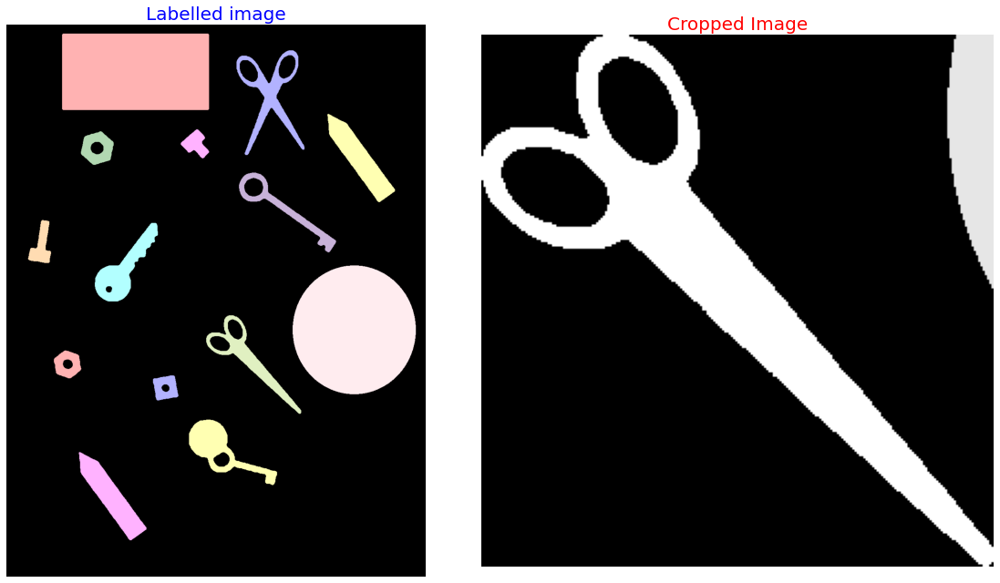

In [265]:
%matplotlib inline

#---------------------------------------------------------------------------------------------------------#
#                                                   preamble.                                             #
#---------------------------------------------------------------------------------------------------------#
import os

print("Current: {0}".format(os.getcwd()))
#os.chdir('/tmp')

#Local Work Directory.
work_dir = 'C:/Users/cianr/OneDrive/Desktop/IPA/'
print(work_dir)

#Image Directory.
image_dir = os.path.join(work_dir, 'images/')
print(image_dir)

!pip show scikit_image

#---------------------------------------------------------------------------------------------------------#
#                                             Importing packages.                                         #
#---------------------------------------------------------------------------------------------------------#
from skimage import data, io, filters, color, exposure
from skimage.color import rgb2gray
from skimage.morphology import disk, closing, square
from skimage.filters import threshold_otsu
from skimage.util import img_as_ubyte, crop
from skimage.color import label2rgb
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops, euler_number
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

#---------------------------------------------------------------------------------------------------------#
#                                          Part 2): Region properties.                                    #                                                                                                                                         #
#---------------------------------------------------------------------------------------------------------#

#a)
 #Develop robust7, fully automated8 and data driven9 code to locate, highlight and display the smallest
 #scissors in the colour image illustrated in Figure 1 (scissors_col_2.jpg). Find and display the area and
 #centroid of this item.
    

    
#Reading in the reference image.
Scissor = io.imread(os.path.join(image_dir, 'scissors.jpg'))

#--------------------------------------------------------------------------------------------------------#
#Adding noise.
#def Gaussian(outputA, variance, M):
    #GaussianNoise = random_noise(outputA, mode = 'gaussian', var = variance**2, mean = M)
    #return GaussianNoise


#Assigning a function to a variable for convenience when the output of the function is needed.
#Gauss = Gaussian(Scissor, 0.0, 0.0)

def MedianFilter(image, FilterRank):
    uint8 = img_as_ubyte(image, force_copy = False)
    medianfil = median(uint8, disk(FilterRank))
    return medianfil

Median = MedianFilter(grayscale, 3)

#-------------------------------------------------------------------------------------------------------#

#Converting RGB to Greyscale.
def Grayscaleconverter(image):
    grayscaleimage = rgb2gray(image)
    return grayscaleimage

grayscale = Grayscaleconverter(Scissor)

#Applying the otsu threshold for background segmentation.
def Threshold_otsu(image):
    Thresholdimg = threshold_otsu(image)
    binary = image > Thresholdimg 
    return binary, Thresholdimg

Threshold = Threshold_otsu(Median)
    
#calling this function 'binary' = Threshold[0], Thresholdimg = Threshold[1].

#Clearing objects connected to the image border.
def Clear(image):
    ClearedBorder = clear_border(image)
    return ClearedBorder

ClearBorder = Clear(Threshold[0])

#Labelling image regions.
def labl(image):
    labelledimg = label(image)
    label_overlay = label2rgb(labelledimg, image = image, bg_label = 0)
    return labelledimg, label_overlay

labelledimage = labl(ClearBorder)


#Configuring axes for uncropped and cropped images.
fig, ax = plt.subplots(ncols=2, figsize=(24, 9))

ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)

ax[0].imshow(labelledimage[1], cmap=plt.cm.gray)
ax[0].set_title('Labelled image', fontsize = 20, color = 'blue')
ax[0].axis('off')



#fig, ax = plt.subplots(figsize = (10, 6))
#ax.imshow(labelledimage[1])


#Creating an empty area for the areas of the scissors.
target = []

#Iterating through the labelled images.
for i in regionprops(labelledimage[0]):
    if i.euler_number == -1:
        if i.area == A:
            
            target.append(i.area)
            
            A = min(target)
            
            C = i.centroid
       
            minr, minc, maxr, maxc = i.bbox
            Area = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                    fill = False, edgecolor = 'blue', linewidth = 1.5)
            ax[0].add_patch(Area)
            

#Cropping the desired scissors.            
def imagecrop (image):
    image_crop = image[minr:maxr, minc:maxc]
    return image_crop

imgCrop = imagecrop(labelledimage[0])

print('This is the area of the samllest scissor image:', A)

print('This is the centroid of the smallest scissor image:', C)  

ax[1].imshow(imgCrop, cmap=plt.cm.gray)
ax[1].set_title('Cropped Image', fontsize = 20, color = 'red')
ax[1].axis('off')

plt.tight_layout()
plt.show()

    

    

    